<a href="https://colab.research.google.com/github/wanjas1/BANK-CUSTOMER-CHURN-PREDICTION/blob/main/BANK_CUSTOMER_CHURN_PREDICTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **BANK CUSTOMER CHURN PREDICTION**





**Business Problem Statement**

In the competitive landscape of the banking industry, customer churn poses a critical business challenge with significant financial and social repercussions. Banks face substantial revenue loss and increased acquisition costs when customers terminate their accounts—a phenomenon directly impacting the institution's growth and profitability.

By applying analytics to predict and analyze churn patterns through customer data like demographics, transaction behaviors, and service interactions, banks can identify at-risk individuals and implement targeted retention strategies. Such data-driven solutions not only have the potential to enhance customer satisfaction and loyalty, reducing churn, but they also promote a positive brand reputation and community trust.

The financial benefits of these analytical applications include stabilizing the bank's revenue stream and minimizing the costs associated with customer turnover. By identifying at-risk customers beforehand, banks can take proactive measures to retain them, thereby improving customer satisfaction and profitability. Socially, a lower churn rate can reflect a bank's commitment to its customers, fostering a supportive financial environment and driving organic growth through word-of-mouth endorsements. Therefore, leveraging analytics to reduce customer churn can catalyze both the economic stability and social standing of a financial institution.

**Data Source**: https://www.kaggle.com/datasets/kafayatyusuf/desktop

In [1]:
# Importing necessary libraries for the project and read the data set

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot as plt
import sklearn.metrics
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Dataset is from Online Repository # https://www.kaggle.com/datasets/kafayatyusuf/desktop

bank = pd.read_excel('bank customer churn.xls')

In [4]:
# Dataset description
display(bank)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned,Age group
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1,2,DIAMOND,464,41-50
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1,3,DIAMOND,456,41-50
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1,3,DIAMOND,377,41-50
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0,5,GOLD,350,31-40
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,0,5,GOLD,425,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0,0,1,DIAMOND,300,31-40
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0,0,5,PLATINUM,771,31-40
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1,1,3,SILVER,564,31-40
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1,1,2,GOLD,339,41-50


# **EXPLORATORY DATA ANALYSIS**

In [5]:
# Check the shape of the dataset: Number of columns and rows
bank.shape

(10000, 19)

In [6]:
# Display information about the dataset and datatypes of each variable
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   RowNumber           10000 non-null  int64  
 1   CustomerId          10000 non-null  int64  
 2   Surname             10000 non-null  object 
 3   CreditScore         10000 non-null  int64  
 4   Geography           10000 non-null  object 
 5   Gender              10000 non-null  object 
 6   Age                 10000 non-null  int64  
 7   Tenure              10000 non-null  int64  
 8   Balance             10000 non-null  float64
 9   NumOfProducts       10000 non-null  int64  
 10  HasCrCard           10000 non-null  int64  
 11  IsActiveMember      10000 non-null  int64  
 12  EstimatedSalary     10000 non-null  float64
 13  Exited              10000 non-null  int64  
 14  Complain            10000 non-null  int64  
 15  Satisfaction Score  10000 non-null  int64  
 16  Card 

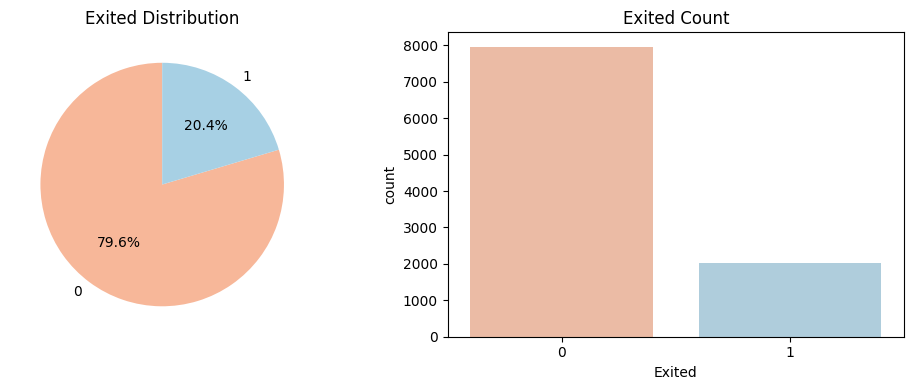

Exited
0    7962
1    2038
Name: count, dtype: int64


In [7]:
# Distribution of the target variable
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
Exited_counts = bank['Exited'].value_counts()
plt.pie(Exited_counts, labels=Exited_counts.index, colors=sns.color_palette('RdBu', len(Exited_counts)), autopct='%1.1f%%', startangle=90)
plt.title('Exited Distribution')

plt.subplot(1, 2, 2)
sns.countplot(data=bank, x='Exited', palette='RdBu')
plt.title('Exited Count')
plt.xlabel('Exited')
plt.tight_layout()
plt.show()
print(bank.Exited.value_counts())

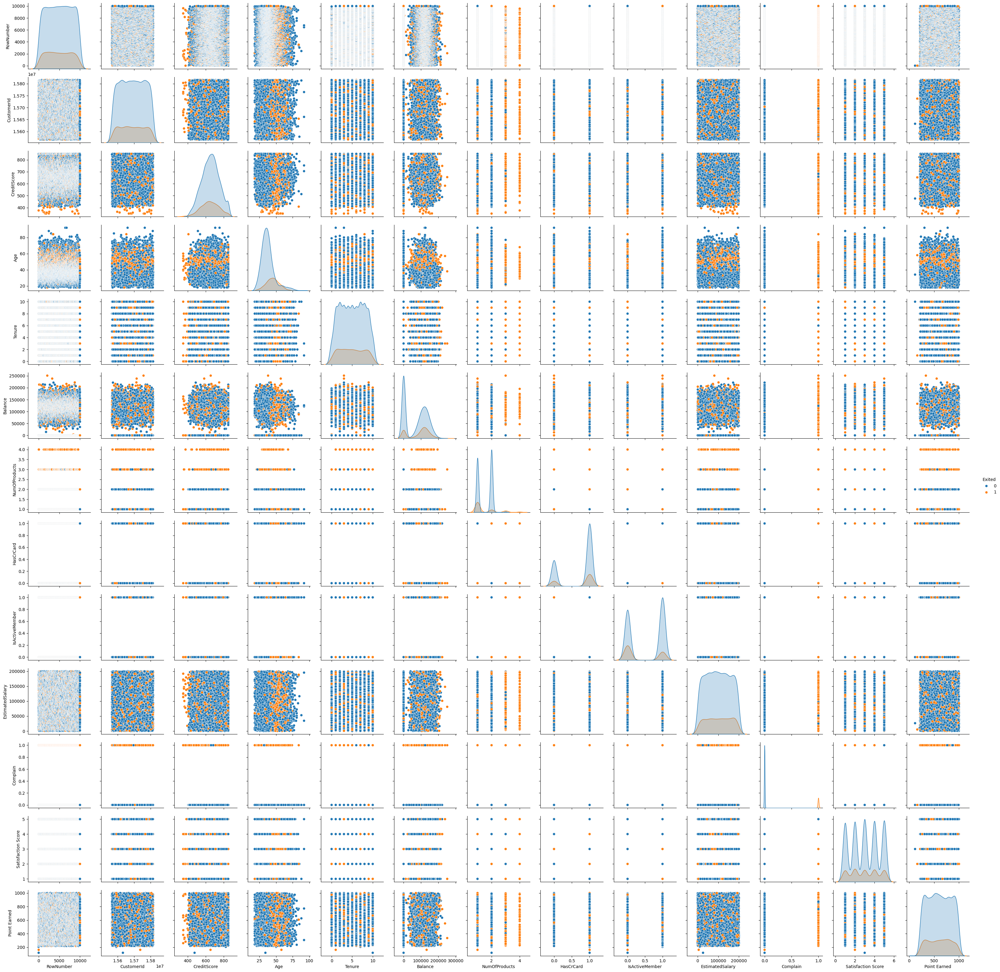

In [8]:
# Explore the distribution and information value of individual features using the pairplot
sns.pairplot(bank, hue = 'Exited')

In [9]:
# Display number of Unique values and unique counts in each columns

for column in bank.columns:
    unique_values = bank[column].unique()
    unique_count = bank[column].nunique()
    print("Column:", column)
    print("Unique values:", unique_values)
    print("Unique count:", unique_count)
    print("------------------------------------------------------------------------------------------------------------------------------------------------------------")

Column: RowNumber
Unique values: [    1     2     3 ...  9998  9999 10000]
Unique count: 10000
------------------------------------------------------------------------------------------------------------------------------------------------------------
Column: CustomerId
Unique values: [15634602 15647311 15619304 ... 15584532 15682355 15628319]
Unique count: 10000
------------------------------------------------------------------------------------------------------------------------------------------------------------
Column: Surname
Unique values: ['Hargrave' 'Hill' 'Onio' ... 'Kashiwagi' 'Aldridge' 'Burbidge']
Unique count: 2932
------------------------------------------------------------------------------------------------------------------------------------------------------------
Column: CreditScore
Unique values: [619 608 502 699 850 645 822 376 501 684 528 497 476 549 635 616 653 587
 726 732 636 510 669 846 577 756 571 574 411 591 533 553 520 722 475 490
 804 582 472 465 556 834

In [10]:
# Data Cleaning - Dropping unwanted variables(dummy) which has no value in the analysis:
# We will not require the 'RowNumber', 'CustomerId', 'Surname' as they are specific to a customer and are just identifiers which do not provide any meaningful information.
# 'Age group' is a duplicate version of the 'Age' variable, so its similar.
bank = bank.drop(['RowNumber', 'CustomerId', 'Surname', 'Age group' ], axis=1)

In [11]:
bank.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1,2,DIAMOND,464
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1,3,DIAMOND,456
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1,3,DIAMOND,377
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0,5,GOLD,350
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,0,5,GOLD,425


In [12]:
# Explore missing values
bank.isnull().sum()

,0
CreditScore,0
Geography,0
Gender,0
Age,0
Tenure,0
Balance,0
NumOfProducts,0
HasCrCard,0
IsActiveMember,0
EstimatedSalary,0


<Axes: >

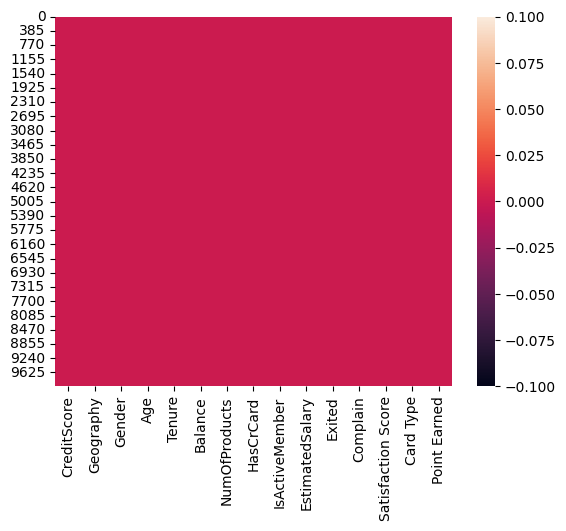

In [13]:
# Visualize distribution of missing values

sns.heatmap(bank.isnull(), cbar=True)

In [14]:
bank.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited', 'Complain', 'Satisfaction Score', 'Card Type',
       'Point Earned'],
      dtype='object')

In [15]:
# Display numerical columns in dataset
bank_num = bank.select_dtypes(exclude = ['object'])
bank_num.columns

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'Complain',
       'Satisfaction Score', 'Point Earned'],
      dtype='object')

In [16]:
# Display categorical columns in dataset
bank_cat = bank.select_dtypes(include = ['object'])
bank_cat.columns

Index(['Geography', 'Gender', 'Card Type'], dtype='object')

**Data Visualizations**

In [21]:
# Function to create a histogram, scatter plot, boxplot and barplot .
def diagnostic_plots(bank, variable,target):
    # The function takes a dataframe (bank) and the variable of interest as arguments.

    # Define figure size.
    plt.figure(figsize=(25, 4))

    # Histogram
    plt.subplot(1, 4, 1)
    sns.histplot(bank[variable], bins=30,color = 'r')
    plt.title('Histogram')


    # Scatterplot
    plt.subplot(1, 4, 2)
    plt.scatter(bank[variable],bank[target],color = 'g')
    plt.title('Scatterplot')


    # Boxplot
    plt.subplot(1, 4, 3)
    sns.boxplot(y=bank[variable],color = 'b')
    plt.title('Boxplot')


    # Barplot
    plt.subplot(1, 4, 4)
    sns.barplot(x = target, y = variable, data = bank)
    plt.title('Barplot')


    plt.show()

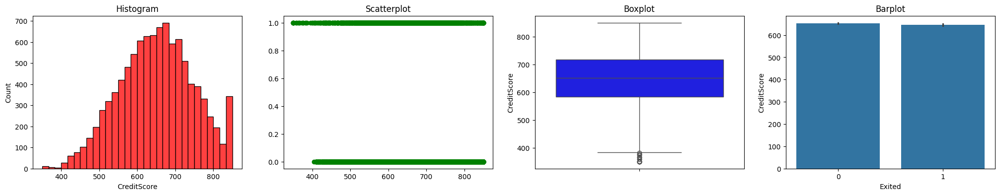

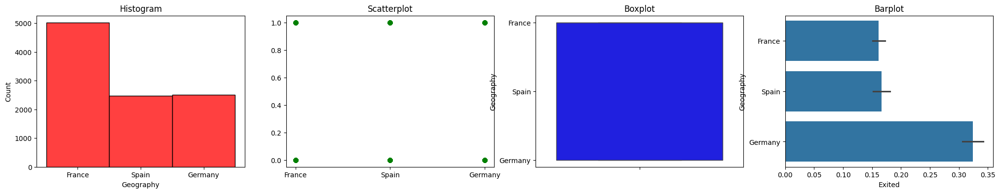

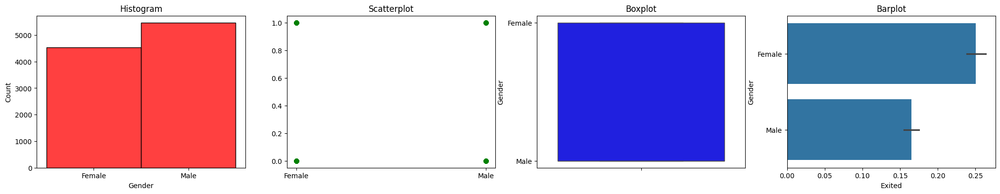

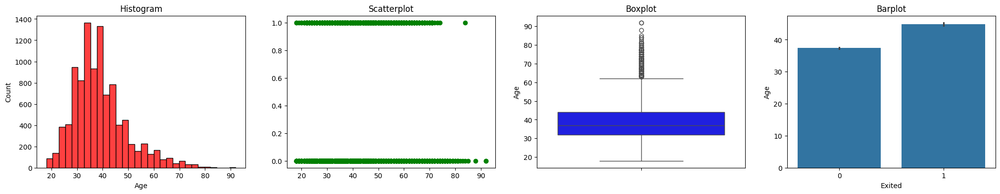

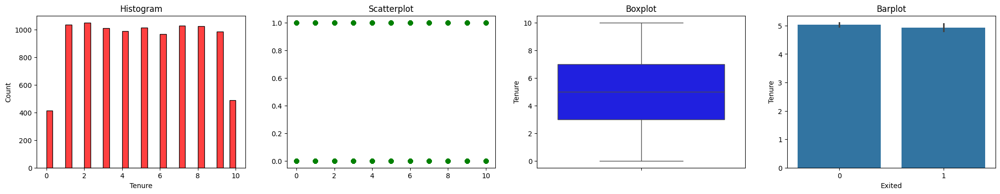

...

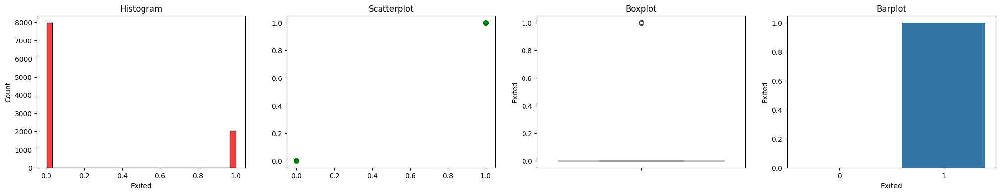

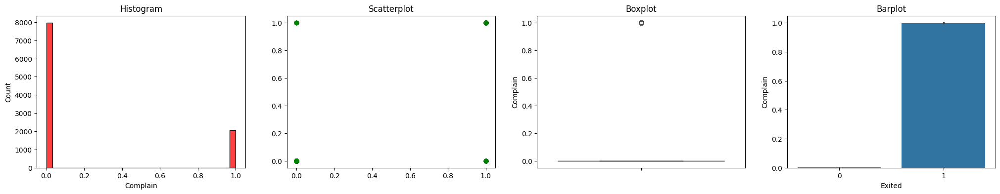

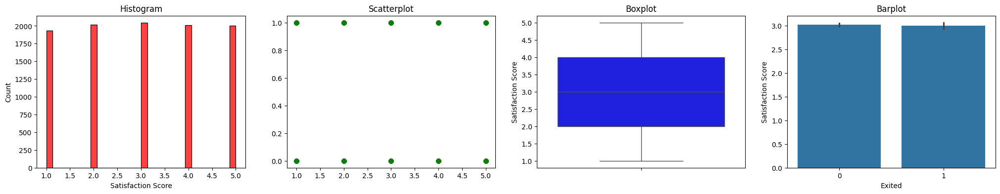

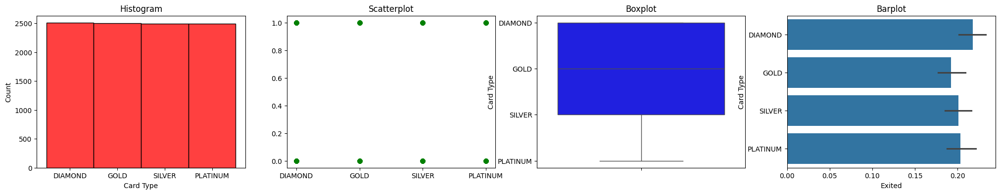

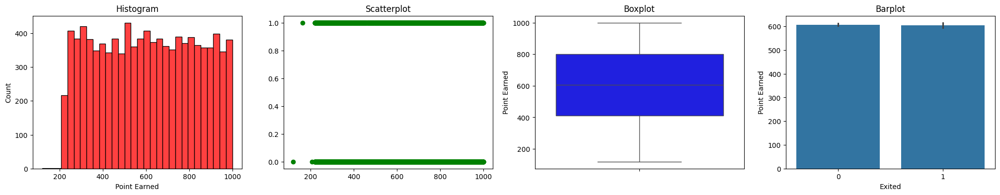

In [18]:
for variable in bank:
    diagnostic_plots(bank,variable,'Exited')

In [19]:
# Function to create a histogram, scatter plot, pie chart, and barplot.
def diagnostic_plots(bank, variable, target):
    # Define figure size.
    plt.figure(figsize=(20, 5))

    # Histogram with Percentages
    plt.subplot(1, 4, 1)
    ax_hist = sns.histplot(bank[variable], bins=30, color='r')
    plt.title('Histogram')
    total = len(bank[variable])  # Total number of data points for percentage calculation
    for p in ax_hist.patches:
        height = p.get_height()
        plt.text(p.get_x() + p.get_width() / 2., height + 3, '{:1.2f}%'.format((height/total)*100), ha="center")

    # Scatterplot
    plt.subplot(1, 4, 2)
    plt.scatter(bank[variable], bank[target], color='g')
    plt.title('Scatterplot')

    # Pie Chart
    plt.subplot(1, 4, 3)
    bank[variable].value_counts().plot.pie(autopct=lambda p: '{:.1f}%\n({:,.0f})'.format(p, (p/100)*bank[variable].count()))
    plt.title('Pie Chart')
    plt.ylabel('')  # Hide the y-axis label on pie chart

    # Vertical Barplot with Percentages
    plt.subplot(1, 4, 4)
    if bank[variable].dtype == 'O':  # Check if variable is categorical
        ax_bar = sns.countplot(x=variable, hue=target, data=bank, palette="Blues_d")
        for p in ax_bar.patches:
            height = p.get_height()
            plt.text(p.get_x() + p.get_width() / 2., height + 3, '{:1.2f}%'.format((height/total)*100), ha="center")
    else:
        ax_bar = sns.barplot(x=target, y=variable, data=bank, palette="Blues_d")
        for p in ax_bar.patches:
            height = p.get_height()
            plt.text(p.get_x() + p.get_width() / 2., height + 3, '{:1.2f}%'.format((height/total)*100), ha="center")
    plt.title('Barplot')

    plt.tight_layout()
    plt.show()

# Example usage:
# for variable in ['Geography', 'Gender', 'Card Type']:
#     diagnostic_plots(bank, variable, 'Exited')


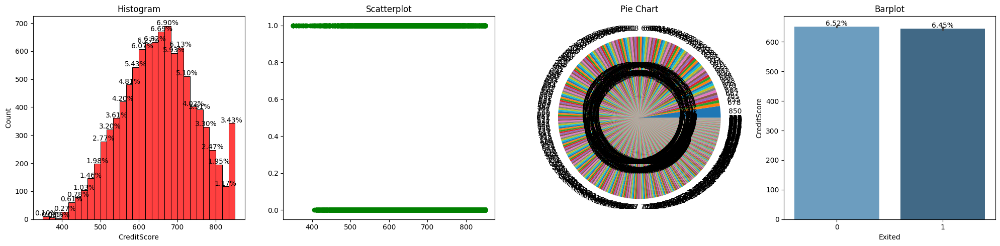

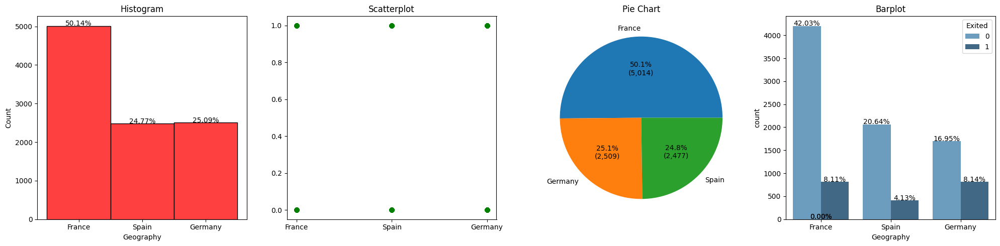

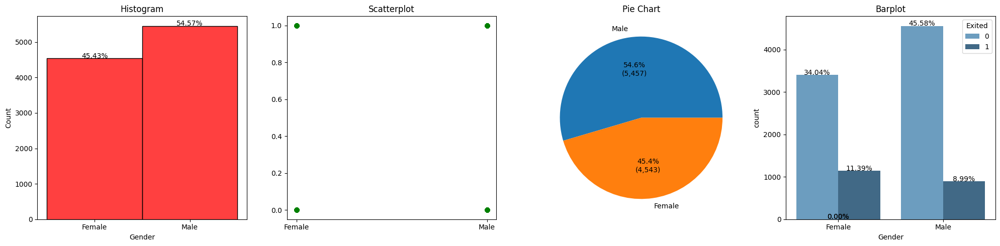

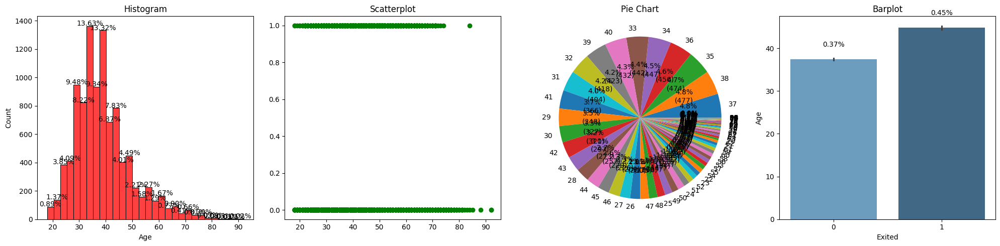

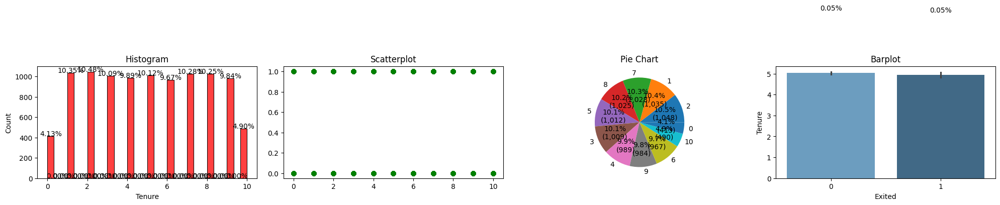

...

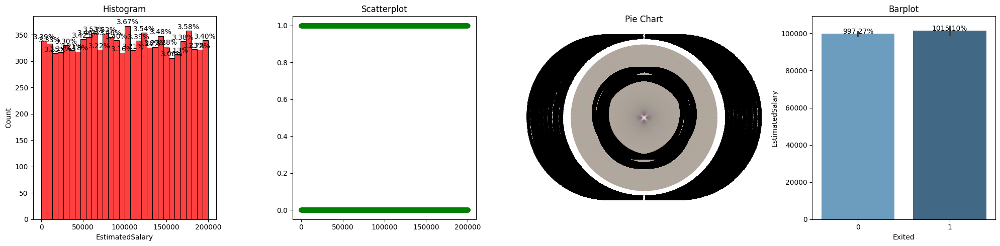

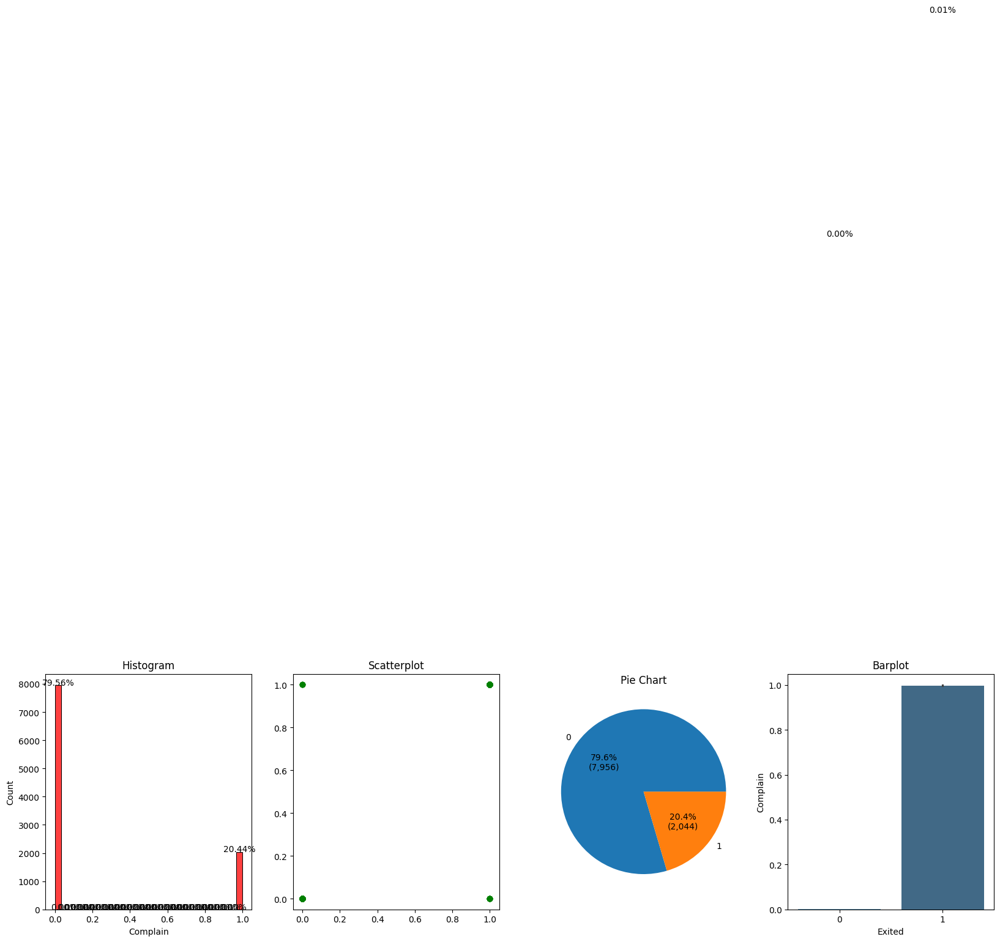

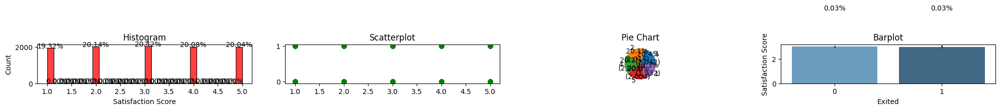

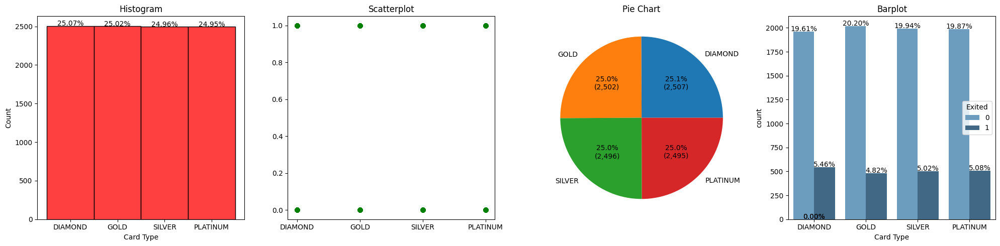

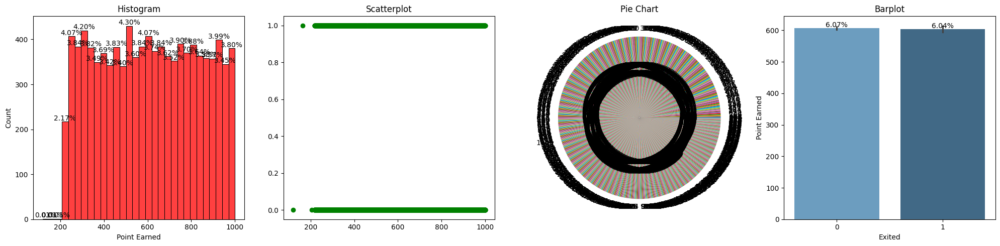

In [20]:
for variable in bank.columns:
    if variable != 'Exited':  # To avoid plotting 'Exited' against itself
        diagnostic_plots(bank, variable, 'Exited')

### **Data Preprocessing**

In [22]:
#Data Preprocessing -> To avoid dummy variable trap (encoding categorical variables)
bank = pd.get_dummies(bank)

In [23]:
# Convert all boolean columns to integers
for col in bank.columns:
    if bank[col].dtype == 'bool':
        bank[col] = bank[col].astype(int)

# Checking the info again to see the changes
print(bank.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CreditScore         10000 non-null  int64  
 1   Age                 10000 non-null  int64  
 2   Tenure              10000 non-null  int64  
 3   Balance             10000 non-null  float64
 4   NumOfProducts       10000 non-null  int64  
 5   HasCrCard           10000 non-null  int64  
 6   IsActiveMember      10000 non-null  int64  
 7   EstimatedSalary     10000 non-null  float64
 8   Exited              10000 non-null  int64  
 9   Complain            10000 non-null  int64  
 10  Satisfaction Score  10000 non-null  int64  
 11  Point Earned        10000 non-null  int64  
 12  Geography_France    10000 non-null  int64  
 13  Geography_Germany   10000 non-null  int64  
 14  Geography_Spain     10000 non-null  int64  
 15  Gender_Female       10000 non-null  int64  
 16  Gende

In [24]:
# Checking summary statistics
bank.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.0,650.528800,96.653299,350.00,584.00,652.000,718.0000,850.00
Age,10000.0,38.921800,10.487806,18.00,32.00,37.000,44.0000,92.00
Tenure,10000.0,5.012800,2.892174,0.00,3.00,5.000,7.0000,10.00
Balance,10000.0,76485.889288,62397.405202,0.00,0.00,97198.540,127644.2400,250898.09
NumOfProducts,10000.0,1.530200,0.581654,1.00,1.00,1.000,2.0000,4.00
HasCrCard,10000.0,0.705500,0.455840,0.00,0.00,1.000,1.0000,1.00
IsActiveMember,10000.0,0.515100,0.499797,0.00,0.00,1.000,1.0000,1.00
EstimatedSalary,10000.0,100090.239881,57510.492818,11.58,51002.11,100193.915,149388.2475,199992.48
Exited,10000.0,0.203800,0.402842,0.00,0.00,0.000,0.0000,1.00
Complain,10000.0,0.204400,0.403283,0.00,0.00,0.000,0.0000,1.00


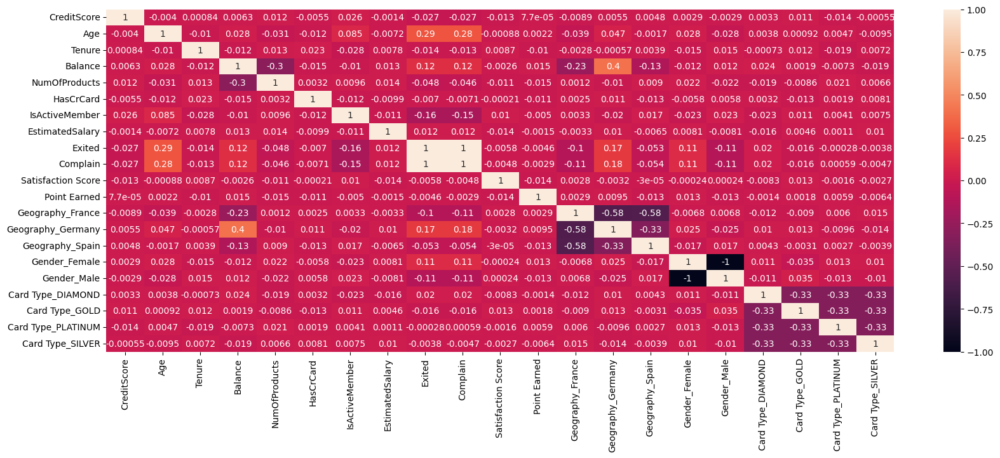

In [25]:
# Correlation Analysis
plt.figure(figsize=(20, 7))
sns.heatmap(bank.corr(), annot=True)
plt.show()

In [26]:
bank.corr()['Exited'].sort_values(ascending=False)

,Exited
Exited,1.000000
Complain,0.995693
Age,0.285296
Geography_Germany,0.173313
Balance,0.118577
Gender_Female,0.106267
Card Type_DIAMOND,0.020089
EstimatedSalary,0.012490
Card Type_PLATINUM,-0.000276
Card Type_SILVER,-0.003834


The following features have a higher correlation with the Target Variable: Age, Geograhy_Germany, Balance, EstimatedSalary, Gender_Female, Gender_Male, Geography_Spain, Geography_France, and IsActiveMember.

In [27]:
high_corr = ['Age', 'Geography_Germany', 'Balance', 'EstimatedSalary', 'Gender_Male', 'Gender_Female', 'Geography_Spain', 'Geography_France', 'IsActiveMember', 'Exited']

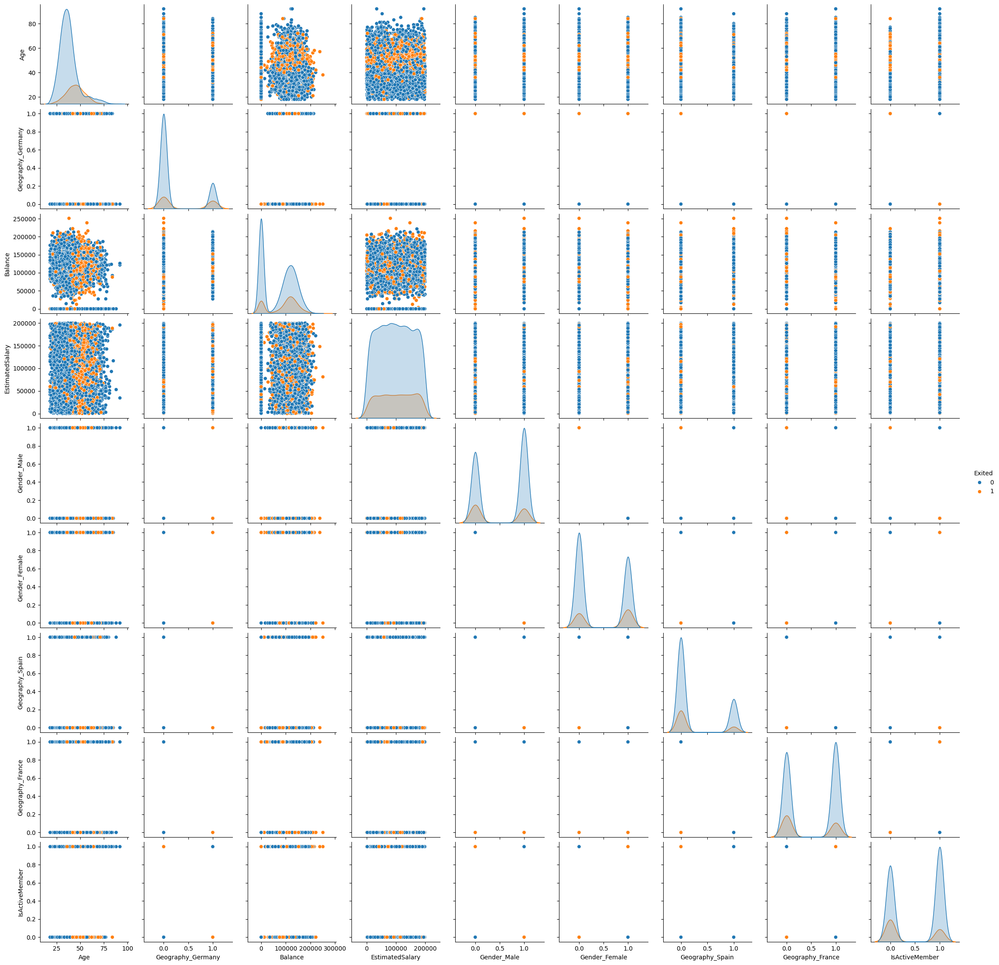

In [28]:
# Explore the distribution and information value of individual features using the pairplot
sns.pairplot(bank[high_corr], hue = 'Exited')

### **Balancing the dataset**

In [29]:
# Data before Balancing
bank['Exited'].value_counts()

,count
Exited,
0,7962
1,2038


In [30]:
from imblearn.over_sampling import SMOTE
import pandas as pd
os = SMOTE(random_state=0)
input_var = list(set(bank.columns) - set(['Exited']))
X, y = os.fit_resample(bank[input_var], bank['Exited'].astype(int))
X = pd.DataFrame(X, columns=input_var)
y = pd.DataFrame(y, columns=['Exited'])

In [31]:
# Checking data after balancing

y['Exited'].value_counts()[0]

np.int64(7962)

In [32]:
# Checking data afer balancing

y['Exited'].value_counts()[1]

np.int64(7962)

Spliting the data into train and test datasets. Developing Decision tree, Random forest, boosted tree model, logistic regression model, kNN (optimize k) model, Naive bayes, ANN, Deep Learning models for churn prediction of bank customers.

# **Decision Tree Model**

In [33]:
X = bank.drop(['Complain', 'Exited'], axis=1)
y = bank['Exited']

In [39]:
X.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Satisfaction Score,Point Earned,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,Card Type_DIAMOND,Card Type_GOLD,Card Type_PLATINUM,Card Type_SILVER
0,619,42,2,0.00,1,1,1,101348.88,2,464,1,0,0,1,0,1,0,0,0
1,608,41,1,83807.86,1,0,1,112542.58,3,456,0,0,1,1,0,1,0,0,0
2,502,42,8,159660.80,3,1,0,113931.57,3,377,1,0,0,1,0,1,0,0,0
3,699,39,1,0.00,2,0,0,93826.63,5,350,1,0,0,1,0,0,1,0,0
4,850,43,2,125510.82,1,1,1,79084.10,5,425,0,0,1,1,0,0,1,0,0


In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [41]:
dt_model = tree.DecisionTreeClassifier(min_samples_leaf=5, max_depth=3)

dt_model.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=5)

In [42]:
y_pred_dt = dt_model.predict(X_test)

In [43]:
from sklearn.metrics import confusion_matrix, classification_report

print("\nConfusion Matrix for Decision Tree Model:\n" ,confusion_matrix(y_test,y_pred_dt))
print("\nClassification Report for Decision Tree Model:\n" ,classification_report(y_test,y_pred_dt))


Confusion Matrix for Decision Tree Model:
 [[2351   22]
 [ 460  167]]

Classification Report for Decision Tree Model:
               precision    recall  f1-score   support

           0       0.84      0.99      0.91      2373
           1       0.88      0.27      0.41       627

    accuracy                           0.84      3000
   macro avg       0.86      0.63      0.66      3000
weighted avg       0.85      0.84      0.80      3000



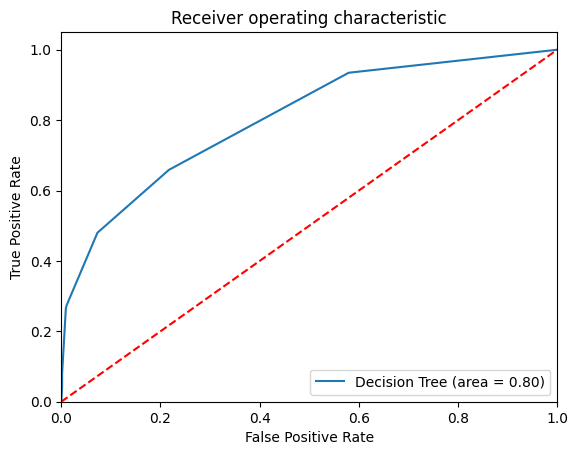

In [44]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

dt_roc_auc = roc_auc_score(y_test, dt_model.predict_proba(X_test)[:,1])
dt_fpr, dt_tpr, thresholds = roc_curve(y_test, dt_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(dt_fpr, dt_tpr, label='Decision Tree (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

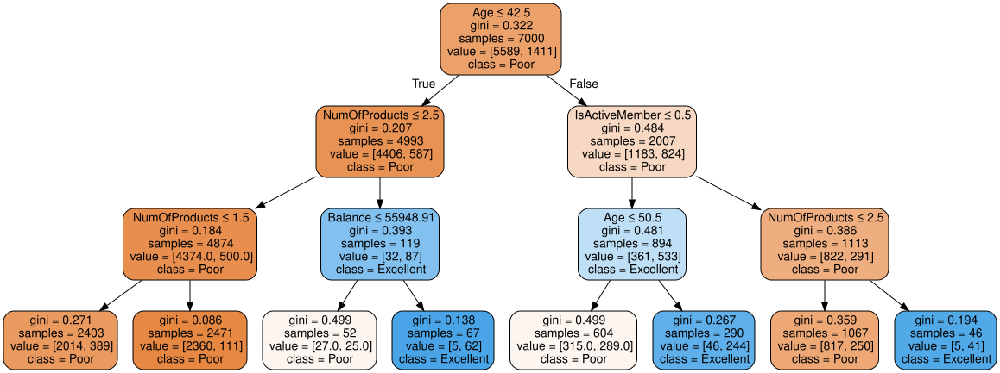

In [45]:
import graphviz
dot_data = tree.export_graphviz(dt_model, out_file=None,
                      feature_names=X.columns,
                      class_names=['Poor','Excellent'],
                      filled=True, rounded=True,
                      special_characters=True)
graph = graphviz.Source(dot_data)
graph


# **Random Forest Model**

In [46]:
from sklearn.ensemble import RandomForestClassifier

rf_model  = RandomForestClassifier(max_depth=5, random_state=0)
rf_model.fit(X_train,y_train)

y_pred_rf = rf_model.predict(X_test)

print("\nConfusion Matrix for Random Forest:\n" ,confusion_matrix(y_test,y_pred_rf))


Confusion Matrix for Random Forest:
 [[2354   19]
 [ 467  160]]


In [47]:
print("\nClassification Report for Random Forest:\n" ,classification_report(y_test,y_pred_rf))


Classification Report for Random Forest:
               precision    recall  f1-score   support

           0       0.83      0.99      0.91      2373
           1       0.89      0.26      0.40       627

    accuracy                           0.84      3000
   macro avg       0.86      0.62      0.65      3000
weighted avg       0.85      0.84      0.80      3000



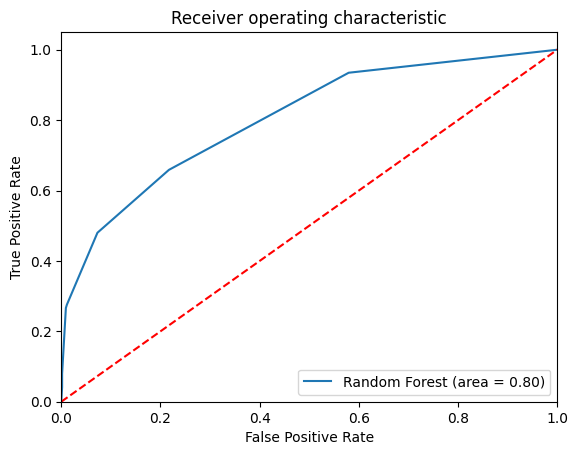

In [48]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

rf_roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:,1])
rf_fpr, rf_tpr, rf_thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(dt_fpr, dt_tpr, label='Random Forest (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

# **Boosted Tree Model**

In [49]:
# Boosted tree model

from sklearn.ensemble import AdaBoostClassifier

bt_model = AdaBoostClassifier(n_estimators=100)

bt_model.fit(X_train,y_train)

y_pred_bt = bt_model.predict(X_test)

print("\nConfusion Matrix for Boosted Tree:\n" ,confusion_matrix(y_test,y_pred_bt))


Confusion Matrix for Boosted Tree:
 [[2295   78]
 [ 351  276]]


In [50]:
print("\nClassification Report for Boosted Tree:\n" ,classification_report(y_test,y_pred_bt))


Classification Report for Boosted Tree:
               precision    recall  f1-score   support

           0       0.87      0.97      0.91      2373
           1       0.78      0.44      0.56       627

    accuracy                           0.86      3000
   macro avg       0.82      0.70      0.74      3000
weighted avg       0.85      0.86      0.84      3000



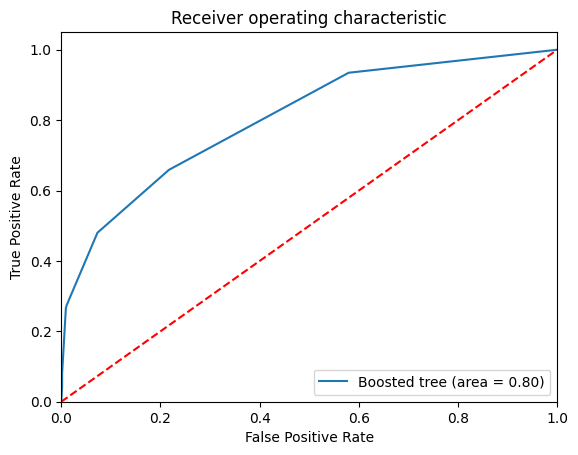

In [51]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

bt_roc_auc = roc_auc_score(y_test, bt_model.predict_proba(X_test)[:,1])
bt_fpr, bt_tpr, bt_thresholds = roc_curve(y_test, bt_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(dt_fpr, dt_tpr, label='Boosted tree (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [52]:
from sklearn.metrics import roc_auc_score

print('ROC AUC: ', roc_auc_score(y_test,y_pred_bt))

ROC AUC:  0.7036608012388171


# **Logistic Regression Model**

In [53]:
logmodel = LogisticRegression(solver='liblinear')

logmodel.fit(X_train,y_train)

LogisticRegression(solver='liblinear')

In [54]:
y_pred_lr = logmodel.predict(X_test)

In [55]:
from sklearn.metrics import confusion_matrix, classification_report

print("\nConfusion Matrix for Logistic Regression Model:\n",confusion_matrix(y_test,y_pred_lr))


Confusion Matrix for Logistic Regression Model:
 [[2365    8]
 [ 623    4]]


In [56]:
print("\nClassification Report for Logistic Regression Model:\n" ,classification_report(y_test,y_pred_lr))


Classification Report for Logistic Regression Model:
               precision    recall  f1-score   support

           0       0.79      1.00      0.88      2373
           1       0.33      0.01      0.01       627

    accuracy                           0.79      3000
   macro avg       0.56      0.50      0.45      3000
weighted avg       0.70      0.79      0.70      3000



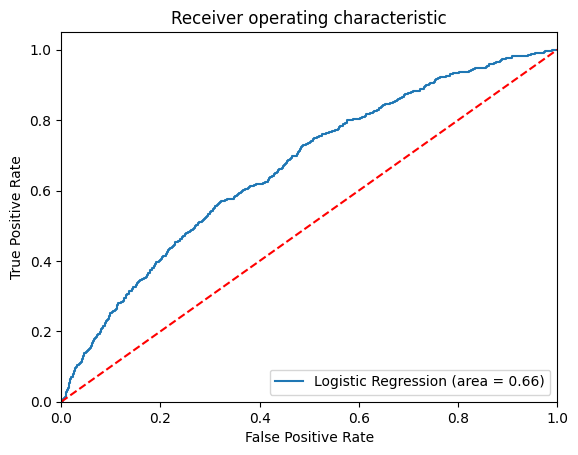

In [57]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

logit_roc_auc = roc_auc_score(y_test, logmodel.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, logmodel.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [58]:
from sklearn.metrics import roc_auc_score

print('ROC AUC: ', roc_auc_score(y_test,y_pred_lr))

ROC AUC:  0.5015041626592628


# **kNN Model**

In [60]:
# Rescale the data for analysis
scaler = MinMaxScaler()
X = bank.drop(['Complain', 'Exited'], axis=1)
X_rescaled = scaler.fit_transform(X)
X_rescaled = pd.DataFrame(X_rescaled, columns=X.columns)

In [61]:
X_rescaled.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Satisfaction Score,Point Earned,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,Card Type_DIAMOND,Card Type_GOLD,Card Type_PLATINUM,Card Type_SILVER
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,0.601058,0.282727,0.501280,0.304848,0.176733,0.70550,0.515100,0.500441,0.50345,0.553366,0.501400,0.250900,0.247700,0.454300,0.545700,0.250700,0.25020,0.249500,0.249600
std,0.193307,0.141727,0.289217,0.248696,0.193885,0.45584,0.499797,0.287580,0.35148,0.256441,0.500023,0.433553,0.431698,0.497932,0.497932,0.433438,0.43315,0.432745,0.432803
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,0.468000,0.189189,0.300000,0.000000,0.000000,0.00000,0.000000,0.254977,0.25000,0.330306,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,0.604000,0.256757,0.500000,0.387402,0.000000,1.00000,1.000000,0.500960,0.50000,0.551646,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000
75%,0.736000,0.351351,0.700000,0.508749,0.333333,1.00000,1.000000,0.746955,0.75000,0.774120,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.00000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


In [62]:
# Develop a kNN model to predict churn occurrence using k = 5
knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean')

In [63]:
# Make predictions on the test set
y_pred_knn = knn.predict(X_test)

In [64]:
knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

print("\nConfusion Matrix for KNN Model:\n" ,confusion_matrix(y_test,y_pred_knn))
print("\nClassification Report for KNN Model:\n" ,classification_report(y_test,y_pred_knn))


Confusion Matrix for KNN Model:
 [[2219  154]
 [ 579   48]]

Classification Report for KNN Model:
               precision    recall  f1-score   support

           0       0.79      0.94      0.86      2373
           1       0.24      0.08      0.12       627

    accuracy                           0.76      3000
   macro avg       0.52      0.51      0.49      3000
weighted avg       0.68      0.76      0.70      3000



In [67]:
from sklearn.metrics import roc_auc_score

print('ROC AUC: ', roc_auc_score(y_test,y_pred_knn))

ROC AUC:  0.5058291343806015


In [68]:
# Determine the optimal value of k based on ROC AUC using cross-validation
max_K = 100
cv_scores = []

for K in range(1, max_K):
    knn = KNeighborsClassifier(n_neighbors=K)
    scores = cross_val_score(knn, X_train, y_train, cv=5, scoring="roc_auc")
    cv_scores.append(scores.mean())


<Axes: >

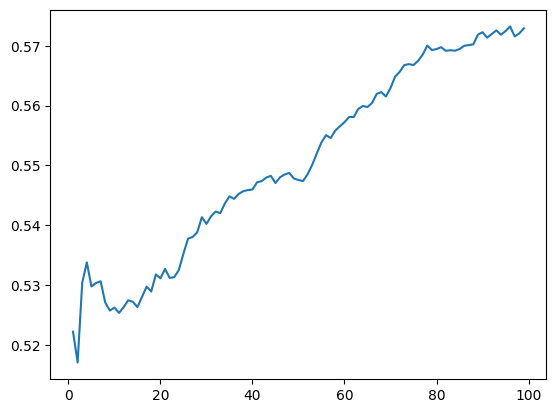

In [69]:
# Display graph
sns.lineplot(x=range(1,max_K), y=cv_scores)

In [70]:
cv_scores[:8]

[np.float64(0.5221862185286013),
 np.float64(0.5170406572242527),
 np.float64(0.5303598566621317),
 np.float64(0.5337821001444026),
 np.float64(0.529746856789892),
 np.float64(0.5303324049343898),
 np.float64(0.5306205331981381),
 np.float64(0.5270676029973387)]

In [71]:
# Find the index of the maximum ROC AUC value
optimal_k_index = np.argmax(cv_scores)

# Retrieve the optimal k value
optimal_k = optimal_k_index + 1  # Adding 1 because K ranges from 1 to max_K, not from 0 to max_K-1

# Retrieve the maximum ROC AUC value
max_roc_auc = cv_scores[optimal_k_index]

# Print the results
print('Optimal k for maximum ROC AUC:', optimal_k)
print('Maximum ROC AUC:', max_roc_auc)

Optimal k for maximum ROC AUC: 96
Maximum ROC AUC: 0.5732186952578535


# Optimized kNN model with K=96

In [72]:
knn = KNeighborsClassifier(n_neighbors=96, metric='euclidean')
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

print("\nConfusion Matrix for KNN Model:\n" ,confusion_matrix(y_test,y_pred_knn))
print("\nClassification Report for KNN Model:\n" ,classification_report(y_test,y_pred_knn))


Confusion Matrix for KNN Model:
 [[2373    0]
 [ 627    0]]

Classification Report for KNN Model:
               precision    recall  f1-score   support

           0       0.79      1.00      0.88      2373
           1       0.00      0.00      0.00       627

    accuracy                           0.79      3000
   macro avg       0.40      0.50      0.44      3000
weighted avg       0.63      0.79      0.70      3000



In [73]:
from sklearn.metrics import roc_auc_score

print('ROC AUC: ', roc_auc_score(y_test,y_pred_knn))

ROC AUC:  0.5


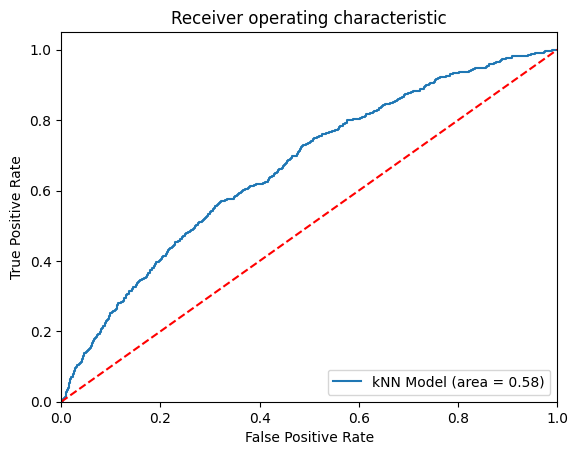

In [74]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

kNN_roc_auc = roc_auc_score(y_test, knn.predict_proba(X_test)[:,1])
knn_fpr, knn_tpr, thresholds = roc_curve(y_test, knn.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='kNN Model (area = %0.2f)' % kNN_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

# **Naive Bayes Model**

In [75]:
X.loc[:, X.isnull().any()].columns

Index([], dtype='object')

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)


In [77]:
nb = MultinomialNB(alpha=0.01)
nb.fit(X_train, y_train)

y_pred_nb = nb.predict(X_test)

print("\nConfusion Matrix for Naive Bayes Model:\n" ,confusion_matrix(y_test,y_pred_nb))
print("\nClassification Report for Naive Bayes:\n" ,classification_report(y_test,y_pred_nb))


Confusion Matrix for Naive Bayes Model:
 [[1297 1076]
 [ 294  333]]

Classification Report for Naive Bayes:
               precision    recall  f1-score   support

           0       0.82      0.55      0.65      2373
           1       0.24      0.53      0.33       627

    accuracy                           0.54      3000
   macro avg       0.53      0.54      0.49      3000
weighted avg       0.69      0.54      0.59      3000



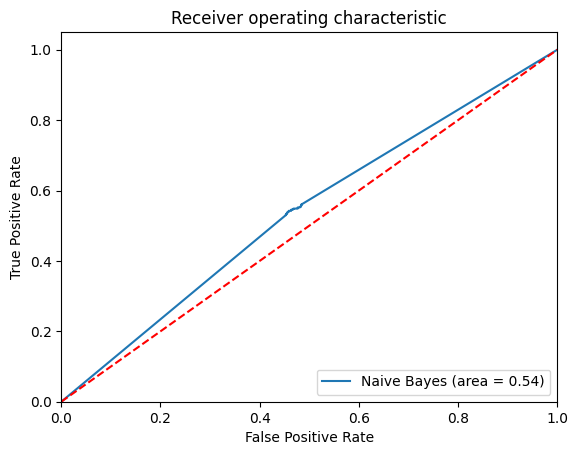

In [78]:
nb_roc_auc = roc_auc_score(y_test, nb.predict_proba(X_test)[:,1])
nb_fpr, nb_tpr, nb_thresholds = roc_curve(y_test, nb.predict_proba(X_test)[:,1])

plt.figure()
plt.plot(nb_fpr, nb_tpr, label='Naive Bayes (area = %0.2f)' % nb_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# **ANN Model**

In [79]:
X_rescaled

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Satisfaction Score,Point Earned,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,Card Type_DIAMOND,Card Type_GOLD,Card Type_PLATINUM,Card Type_SILVER
0,0.538,0.324324,0.2,0.000000,0.000000,1.0,1.0,0.506735,0.25,0.391600,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1,0.516,0.310811,0.1,0.334031,0.000000,0.0,1.0,0.562709,0.50,0.382520,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.304,0.324324,0.8,0.636357,0.666667,1.0,0.0,0.569654,0.50,0.292849,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,0.698,0.283784,0.1,0.000000,0.333333,0.0,0.0,0.469120,1.00,0.262202,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,1.000,0.337838,0.2,0.500246,0.000000,1.0,1.0,0.395400,1.00,0.347333,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.842,0.283784,0.5,0.000000,0.333333,1.0,0.0,0.481341,0.00,0.205448,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
9996,0.332,0.229730,1.0,0.228657,0.000000,1.0,1.0,0.508490,1.00,0.740068,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
9997,0.718,0.243243,0.7,0.000000,0.000000,0.0,1.0,0.210390,0.50,0.505108,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
9998,0.844,0.324324,0.3,0.299226,0.333333,1.0,0.0,0.464429,0.25,0.249716,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [80]:
X_train, X_test, y_train, y_test = train_test_split(X_rescaled,y,test_size=0.30,random_state=1)

In [81]:
MLPC_model = MLPClassifier(hidden_layer_sizes=20, activation='logistic', solver='adam', random_state=1)

MLPC_model.fit(X_train, y_train)

MLPClassifier(activation='logistic', hidden_layer_sizes=20, random_state=1)

In [82]:
y_pred_mlpc = MLPC_model.predict(X_test)

print(confusion_matrix(y_test,y_pred_mlpc))
print(classification_report(y_test,y_pred_mlpc))

[[2303   70]
 [ 490  137]]
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      2373
           1       0.66      0.22      0.33       627

    accuracy                           0.81      3000
   macro avg       0.74      0.59      0.61      3000
weighted avg       0.79      0.81      0.77      3000



In [83]:
print('ROC AUC: ', roc_auc_score(y_test,MLPC_model.predict_proba(X_test)[:,1]))

ROC AUC:  0.7689342691671524


In [84]:
from sklearn.model_selection import cross_val_score
min_hidden_layer_size = 5
max_hidden_layer_size = 30
cv_scores = [ ]

for s in range(min_hidden_layer_size,max_hidden_layer_size,1):
    MLPC_model = MLPClassifier(hidden_layer_sizes=s, activation='logistic', solver='lbfgs', random_state=1)
    scores = cross_val_score(MLPC_model,X_train,y_train.values.ravel(),cv = 5,scoring = "accuracy")
    cv_scores.append(scores.mean())

<Axes: >

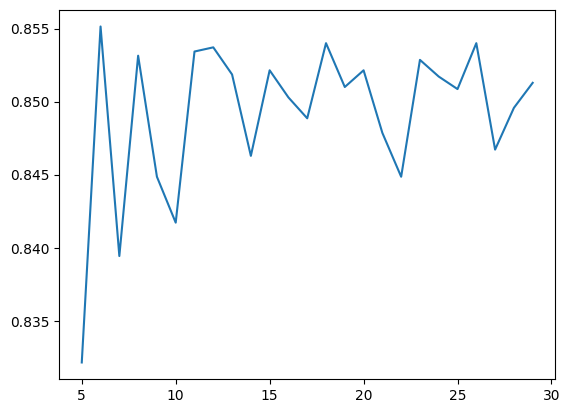

In [85]:
sns.lineplot(x=range(min_hidden_layer_size,max_hidden_layer_size,1), y=cv_scores)

In [86]:
# Code to Find the optimal number of nodes
optimal_nodes_index = np.argmax(cv_scores)  # Index of the maximum average cross-validation accuracy
optimal_nodes = min_hidden_layer_size + optimal_nodes_index * 1  # Converting index to corresponding number of nodes
optimal_accuracy = cv_scores[optimal_nodes_index]

print(f'Optimal Number of Hidden Nodes: {optimal_nodes}')
print(f'Accuracy with Optimal Number of Hidden Nodes: {optimal_accuracy}')

Optimal Number of Hidden Nodes: 6
Accuracy with Optimal Number of Hidden Nodes: 0.8551428571428572


In [87]:
MLPC_model = MLPClassifier(hidden_layer_sizes=12, activation='logistic', solver='adam', random_state=1)

MLPC_model.fit(X_train, y_train)

y_pred_mlpc = MLPC_model.predict(X_test)

print("\nConfusion_matrix for ANN:\n" ,confusion_matrix(y_test,y_pred_mlpc))
print("\nClassification Report for ANN:\n" ,classification_report(y_test,y_pred_mlpc))


Confusion_matrix for ANN:
 [[2299   74]
 [ 482  145]]

Classification Report for ANN:
               precision    recall  f1-score   support

           0       0.83      0.97      0.89      2373
           1       0.66      0.23      0.34       627

    accuracy                           0.81      3000
   macro avg       0.74      0.60      0.62      3000
weighted avg       0.79      0.81      0.78      3000



In [88]:
print('ROC AUC: ', roc_auc_score(y_test,MLPC_model.predict_proba(X_test)[:,1]))

ROC AUC:  0.7747338310915396


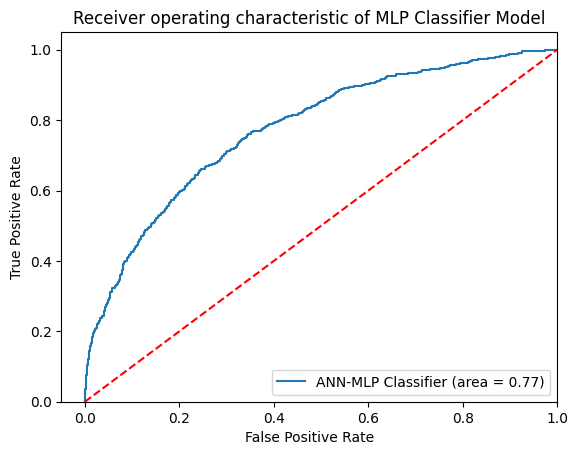

In [89]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

MLPC_roc_auc = roc_auc_score(y_test, MLPC_model.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, MLPC_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='ANN-MLP Classifier (area = %0.2f)' % MLPC_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic of MLP Classifier Model')
plt.legend(loc="lower right")
plt.savefig('MLPC_ROC')
plt.show()

## **Deep Learning Model (DL)**

In [90]:
print('Incidents of Exited: ', bank.Exited.mean())

Incidents of Exited:  0.2038


In [91]:
X_train, X_test, y_train, y_test = train_test_split(X_rescaled,y,test_size=0.30,random_state=1)

In [92]:
print('Training dataset shape: ', X_train.shape)
print('Test dataset shape: ', X_test.shape)

Training dataset shape:  (7000, 19)
Test dataset shape:  (3000, 19)


In [93]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Activation,Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [94]:
X_train.shape

(7000, 19)

In [95]:
#Building Sequencial neural network with 3 hidden layers and a dropout of 0.5 at each layer
dl_model = Sequential()
dl_model.add(Dense(units=100,activation='relu'))
dl_model.add(Dropout(0.5))

dl_model.add(Dense(units=50,activation='relu'))
dl_model.add(Dropout(0.5))

dl_model.add(Dense(units=25,activation='relu'))
dl_model.add(Dropout(0.5))

dl_model.add(Dense(units=1,activation='sigmoid'))
dl_model.compile(loss='binary_crossentropy', optimizer='adam')
early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=5, verbose=1)

In [96]:
dl_model.fit(x=X_train,
          y=y_train,
          batch_size=128,
          epochs=150,
          validation_data=(X_test, y_test), verbose=1,
          callbacks=[early_stop]
          )

Epoch 1/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.7828 - val_loss: 0.5182
Epoch 2/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5514 - val_loss: 0.4966
Epoch 3/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5180 - val_loss: 0.4856
Epoch 4/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4986 - val_loss: 0.4793
Epoch 5/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5011 - val_loss: 0.4772
Epoch 6/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4884 - val_loss: 0.4781
Epoch 7/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4941 - val_loss: 0.4689
Epoch 8/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4850 - val_loss: 0.4679
Epoch 9/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4848 - val_loss: 0.4606
Epoch 10/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4767 - val_loss: 0.4568
Epoch 11/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4685 - val_loss: 0.4526
Epoch 12/150
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4

<Axes: >

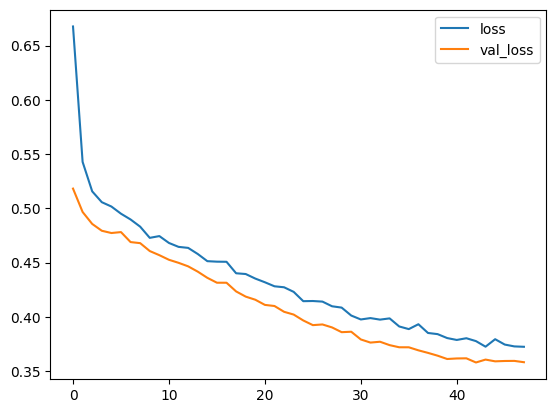

In [97]:
# Plot training and validation losses versus epochs.
model_loss = pd.DataFrame(dl_model.history.history)
model_loss.plot()

In [98]:
y_pred_dl =(dl_model.predict(X_test) > 0.5).astype("int32")

print("\nconfusion_matrix for Deep Learning:\n" ,confusion_matrix(y_test,y_pred_dl))
print("\nClassification Report for Deep Learning:\n" ,classification_report(y_test,y_pred_dl))
print('ROC AUC: ', roc_auc_score(y_test,dl_model.predict(X_test)))

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

confusion_matrix for Deep Learning:
 [[2302   71]
 [ 354  273]]

Classification Report for Deep Learning:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      2373
           1       0.79      0.44      0.56       627

    accuracy                           0.86      3000
   macro avg       0.83      0.70      0.74      3000
weighted avg       0.85      0.86      0.84      3000

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
ROC AUC:  0.8469860626358064


94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


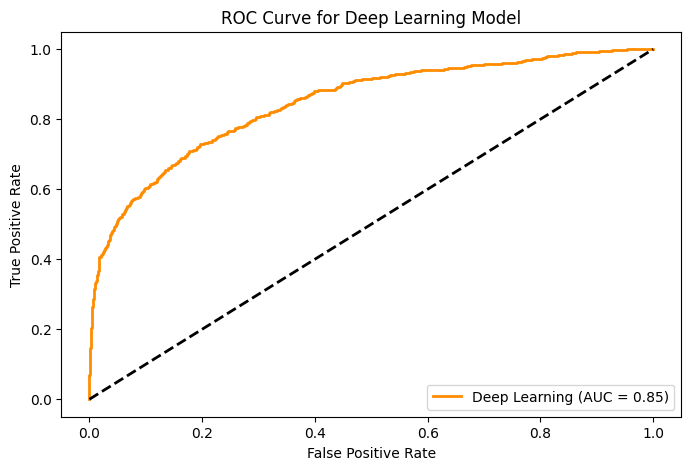

In [99]:
from sklearn.metrics import roc_curve, auc
# Predict probabilities for ROC curve
y_scores = dl_model.predict(X_test)

# Compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_scores)
roc_auc_model = auc(fpr, tpr)

# Plotting the ROC curve
plt.figure(figsize=(8, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Deep Learning (AUC = {roc_auc_model:.2f})')
plt.plot([0, 1], [0, 1], color='black', linestyle='--', lw=2)  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Deep Learning Model')
plt.legend(loc='lower right')
plt.show()

In [100]:
# Final Classification Report of all models

print("\nClassification Report for Decision Tree Model:\n" ,classification_report(y_test,y_pred_dt))

print("\nClassification Report for Random Forest:\n" ,classification_report(y_test,y_pred_rf))

print("\nClassification Report for Boosted Tree:\n" ,classification_report(y_test,y_pred_bt))

print("\nClassification Report for Logistic Regression Model:\n" ,classification_report(y_test,y_pred_lr))

print("\nClassification Report for KNN Model:\n" ,classification_report(y_test,y_pred_knn))

print("\nClassification Report for Naive Bayes:\n" ,classification_report(y_test,y_pred_nb))

print("\nClassification Report for ANN:\n" ,classification_report(y_test,y_pred_mlpc))

print("\nClassification Report for Deep Learning:\n" ,classification_report(y_test,y_pred_dl))


Classification Report for Decision Tree Model:
               precision    recall  f1-score   support

           0       0.84      0.99      0.91      2373
           1       0.88      0.27      0.41       627

    accuracy                           0.84      3000
   macro avg       0.86      0.63      0.66      3000
weighted avg       0.85      0.84      0.80      3000


Classification Report for Random Forest:
               precision    recall  f1-score   support

           0       0.83      0.99      0.91      2373
           1       0.89      0.26      0.40       627

    accuracy                           0.84      3000
   macro avg       0.86      0.62      0.65      3000
weighted avg       0.85      0.84      0.80      3000


Classification Report for Boosted Tree:
               precision    recall  f1-score   support

           0       0.87      0.97      0.91      2373
           1       0.78      0.44      0.56       627

    accuracy                           0.86     

# Final ROC AUC Curve

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


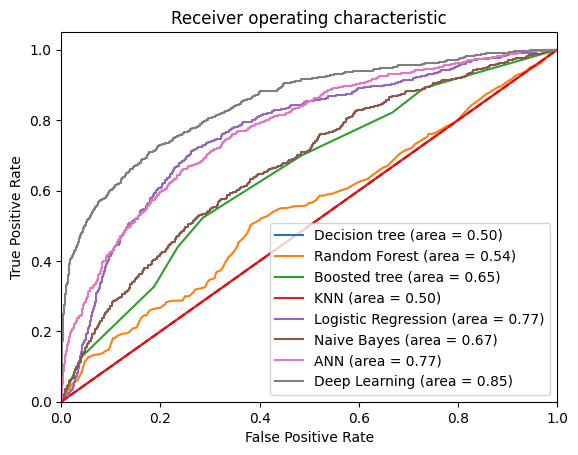

In [101]:
# Decision Tree
dt_roc_auc = roc_auc_score(y_test, dt_model.predict_proba(X_test)[:,1])
dt_fpr, dt_tpr, thresholds = roc_curve(y_test, dt_model.predict_proba(X_test)[:,1])

# Random Forest
rf_roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:,1])
rf_fpr, rf_tpr, rf_thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:,1])

# Boosted Tree
bt_roc_auc = roc_auc_score(y_test, bt_model.predict_proba(X_test)[:,1])
bt_fpr, bt_tpr, bt_thresholds = roc_curve(y_test, bt_model.predict_proba(X_test)[:,1])

# kNN Model
kNN_roc_auc = roc_auc_score(y_test, knn.predict_proba(X_test)[:,1])
knn_fpr, knn_tpr, thresholds = roc_curve(y_test, knn.predict_proba(X_test)[:,1])

# Logistic Regression
logit_roc_auc = roc_auc_score(y_test, logmodel.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, logmodel.predict_proba(X_test)[:,1])

# Naive Bayes
nb_roc_auc = roc_auc_score(y_test, nb.predict_proba(X_test)[:,1])
nb_fpr, nb_tpr, nb_thresholds = roc_curve(y_test, nb.predict_proba(X_test)[:,1])

# ANN Model
ann_roc_auc = roc_auc_score(y_test, MLPC_model.predict_proba(X_test)[:,1])
ann_fpr, ann_tpr, ann_thresholds = roc_curve(y_test, MLPC_model.predict_proba(X_test)[:,1])

# Deep Learning Model
dl_roc_auc = roc_auc_score(y_test, dl_model.predict(X_test))
dl_fpr, dl_tpr, dl_thresholds = roc_curve(y_test, dl_model.predict(X_test))

plt.figure()
plt.plot(dt_fpr, dt_tpr, label='Decision tree (area = %0.2f)' % dt_roc_auc)
plt.plot(rf_fpr, rf_tpr, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot(bt_fpr, bt_tpr, label='Boosted tree (area = %0.2f)' % bt_roc_auc)
plt.plot(knn_fpr, knn_tpr, label='KNN (area = %0.2f)' % kNN_roc_auc)
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(nb_fpr, nb_tpr, label='Naive Bayes (area = %0.2f)' % nb_roc_auc)
plt.plot(ann_fpr, ann_tpr, label='ANN (area = %0.2f)' % ann_roc_auc)
plt.plot(dl_fpr, dl_tpr, label='Deep Learning (area = %0.2f)' % dl_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

## **Summarizing the better model based on each metric :**

1. **Precision**:
Precision measures the proportion of positive identifications that were actually correct. The Random Forest model has the highest precision for Class 1 (exited), indicating that when it predicts a customer will churn, it is more likely to be correct compared to other models.

2. **Recall**:
Recall, or sensitivity, measures the proportion of actual positives that were correctly identified. The Random Forest and Boosted Tree models have a higher recall for Class 0 (not exited), but they have a lower recall for Class 1 (exited) compared to other models. This means they are good at identifying customers who did not churn but not as good at identifying those who did churn.

3. **F1-Score**:
The F1-score is the harmonic mean of precision and recall, which balances the two metrics. Among the models, the Random Forest and Boosted Tree models have higher F1-scores for Class 0 but a lower score for Class 1 compared to other models, indicating they are better overall when considering both precision and recall but still not ideal for identifying churned customers (Class 1).

4. **ROC AUC**:
Based on the ROC curve and AUC values:Random Forest and Boosted Tree models have the highest AUC (0.85), indicating they are the best among the ones presented for distinguishing between the customer classes overall.
The Decision Tree model follows them with an AUC of 0.80.
Logistic Regression has an AUC of 0.69.
Naive Bayes and KNN are the weakest, with AUCs of 0.54 and 0.58, respectively.
Best Model Based on Metrics
Recall: No clear winner; it depends on the class of interest. For Class 0, Random Forest and Boosted Tree are best. For Class 1, despite the lower AUC, Decision Tree, Logistic Regression, KNN, and Naive Bayes have higher recalls.
Precision: Random Forest outperforms the other models for Class 1.
F1-Score: Random Forest and Boosted Tree have the best F1-scores for Class 0, but all models have relatively poor scores for Class 1.
ROC AUC: Random Forest and Boosted Tree are the best, but Random Forest has a slightly better precision, giving it a slight edge overall.

**Conclusion**:
Considering all the metrics, the Random Forest model is the best performing model for this bank customer churn prediction task based on the provided data. It has a good balance between precision and recall, especially for predicting customers who do not churn (Class 0), and it has the highest AUC, suggesting strong overall performance. However, there is still room for improvement in identifying churned customers (Class 1), as indicated by lower recall and F1-scores. Banks should consider using the Random Forest model for initial churn prediction efforts but might want to combine it with other strategies or further model tuning to better identify at-risk customers.